In [1]:
import os
import scanpy as sc
import re
from pathlib import Path

import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler

In [2]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 120
mpl.rcParams['figure.figsize'] = (6, 5)

In [3]:
out_dir = '../data/codex/CRC112/analysis'
Path(out_dir).mkdir(parents=True, exist_ok=True)
sc.settings.figdir = out_dir

In [12]:
df = pd.read_csv('../data/codex/CRC112/exports/table.csv')
df

,ID,Cell Center X,Cell Center Y,Cell Size,Quality Nuclear Segmentation,reg001_cyc001_ch001_DAPI1 Cell Exp,reg001_cyc001_ch001_DAPI1 Cell Intensity Average,reg001_cyc002_ch002_Ki67 Cell Exp,reg001_cyc002_ch002_Ki67 Cell Intensity Average,reg001_cyc002_ch003_FOXP3 Cell Exp,...,reg001_cyc010_ch003_PD1 Cell Exp,reg001_cyc010_ch003_PD1 Cell Intensity Average,reg001_cyc010_ch004_CK7 Cell Exp,reg001_cyc010_ch004_CK7 Cell Intensity Average,reg001_cyc011_ch002_CD14 Cell Exp,reg001_cyc011_ch002_CD14 Cell Intensity Average,reg001_cyc011_ch003_CD68 Cell Exp,reg001_cyc011_ch003_CD68 Cell Intensity Average,reg001_cyc011_ch004_CD206 Cell Exp,reg001_cyc011_ch004_CD206 Cell Intensity Average
0,1,518.120605,7.150794,630,100.000000,5243.767090,1991.252441,133.698120,80.276192,175.364777,...,54.591194,45.446033,32.528301,19.628571,1089.560547,875.747620,377.408813,333.312714,23.414013,20.261906
1,2,650.704468,10.949254,670,99.064423,5048.441895,2402.123779,186.248993,155.388062,332.261047,...,95.166267,93.270149,137.421692,135.444778,435.590363,416.871643,1515.144897,1392.370117,113.731590,113.002983
2,3,698.410095,11.961606,573,100.000000,23343.638672,8445.711914,257.970428,145.837692,245.526627,...,101.041420,69.270508,92.982246,90.176262,262.603546,246.844681,1031.787109,879.254822,63.792900,59.169285
3,4,784.839905,12.765226,1018,96.864845,11012.070312,3929.193604,257.436584,133.103149,469.445435,...,263.861359,151.925339,50.943954,30.735756,1017.814148,718.221985,949.297913,511.719055,170.002945,101.119843
4,5,793.776611,2.287234,94,100.000000,6934.953613,5186.148926,264.674408,167.744675,339.418610,...,96.674416,82.319145,95.860466,57.436169,533.906982,376.680847,422.488373,310.478729,94.162788,71.170212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86346,86347,12375.891602,19882.250000,359,100.000000,14868.842773,10263.911133,221.609528,187.587738,189.938095,...,81.838928,72.022285,50.328857,39.119778,779.563782,363.701935,616.852356,309.428955,193.711411,88.927574
86347,86348,11698.097656,19883.744141,133,100.000000,5628.353027,4323.263184,169.470581,149.932327,279.455872,...,143.132355,133.097748,152.426468,147.766922,438.926483,313.218048,1014.117676,790.518799,142.985291,100.616539
86348,86349,12045.980469,19879.167969,516,99.085411,6507.289551,2022.199585,144.803741,101.193802,143.000000,...,93.532707,65.089149,41.738319,32.317829,1893.570068,894.143433,1277.794434,525.953491,514.598145,240.317825
86349,86350,12074.231445,19878.654297,522,100.000000,4403.200195,1506.331421,132.676193,101.706894,130.752380,...,80.599998,61.036400,63.819046,42.386974,371.292572,351.312256,255.820145,236.992340,138.966431,128.490417


In [14]:
keep = [
    'ID',
    'Cell Center X',
    'Cell Center Y',
    'Cell Size',  
]
marker_keep = [
    'Cell Intensity Average',
]
for col in marker_keep:
    keep += [c for c in df.columns
             if col in c
             if '.' not in c]
keep

['ID',
 'Cell Center X',
 'Cell Center Y',
 'Cell Size',
 'reg001_cyc001_ch001_DAPI1 Cell Intensity Average',
 'reg001_cyc002_ch002_Ki67 Cell Intensity Average',
 'reg001_cyc002_ch003_FOXP3 Cell Intensity Average',
 'reg001_cyc002_ch004_CD20 Cell Intensity Average',
 'reg001_cyc003_ch002_CD8 Cell Intensity Average',
 'reg001_cyc003_ch003_CD4 Cell Intensity Average',
 'reg001_cyc003_ch004_CD31 Cell Intensity Average',
 'reg001_cyc004_ch003_PDL1 Cell Intensity Average',
 'reg001_cyc004_ch004_PanCK Cell Intensity Average',
 'reg001_cyc005_ch002_Ecadherin Cell Intensity Average',
 'reg001_cyc005_ch003_CD11c Cell Intensity Average',
 'reg001_cyc005_ch004_CD56 Cell Intensity Average',
 'reg001_cyc006_ch002_CD44 Cell Intensity Average',
 'reg001_cyc006_ch003_CD3e Cell Intensity Average',
 'reg001_cyc006_ch004_SMA Cell Intensity Average',
 'reg001_cyc007_ch002_CD21 Cell Intensity Average',
 'reg001_cyc007_ch003_HLADR Cell Intensity Average',
 'reg001_cyc007_ch004_FAP Cell Intensity Average',
 

In [15]:
df = df[keep]
df

,ID,Cell Center X,Cell Center Y,Cell Size,reg001_cyc001_ch001_DAPI1 Cell Intensity Average,reg001_cyc002_ch002_Ki67 Cell Intensity Average,reg001_cyc002_ch003_FOXP3 Cell Intensity Average,reg001_cyc002_ch004_CD20 Cell Intensity Average,reg001_cyc003_ch002_CD8 Cell Intensity Average,reg001_cyc003_ch003_CD4 Cell Intensity Average,...,reg001_cyc008_ch004_CK8 Cell Intensity Average,reg001_cyc009_ch002_CD45RA Cell Intensity Average,reg001_cyc009_ch003_LAG3 Cell Intensity Average,reg001_cyc009_ch004_Vimentin Cell Intensity Average,reg001_cyc010_ch002_GranzymeB Cell Intensity Average,reg001_cyc010_ch003_PD1 Cell Intensity Average,reg001_cyc010_ch004_CK7 Cell Intensity Average,reg001_cyc011_ch002_CD14 Cell Intensity Average,reg001_cyc011_ch003_CD68 Cell Intensity Average,reg001_cyc011_ch004_CD206 Cell Intensity Average
0,1,518.120605,7.150794,630,1991.252441,80.276192,99.995239,119.396828,81.661903,1580.584106,...,21.806349,70.933334,88.579369,1370.460327,51.809525,45.446033,19.628571,875.747620,333.312714,20.261906
1,2,650.704468,10.949254,670,2402.123779,155.388062,295.234314,331.505981,220.998505,813.099976,...,37.976120,115.502983,179.488052,3659.990967,98.861191,93.270149,135.444778,416.871643,1392.370117,113.002983
2,3,698.410095,11.961606,573,8445.711914,145.837692,148.872604,186.755676,158.347290,306.460724,...,25.553228,107.333336,131.872604,2038.623047,99.787086,69.270508,90.176262,246.844681,879.254822,59.169285
3,4,784.839905,12.765226,1018,3929.193604,133.103149,238.666992,266.188599,231.195480,719.470520,...,30.575638,156.233795,263.613953,152.039291,89.363457,151.925339,30.735756,718.221985,511.719055,101.119843
4,5,793.776611,2.287234,94,5186.148926,167.744675,228.819153,276.680847,140.372345,339.744690,...,22.404255,222.053192,177.904251,149.617020,131.329788,82.319145,57.436169,376.680847,310.478729,71.170212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86346,86347,12375.891602,19882.250000,359,10263.911133,187.587738,167.089142,92.752090,600.529236,713.370483,...,26.286907,220.534821,113.710304,2537.699219,162.490250,72.022285,39.119778,363.701935,309.428955,88.927574
86347,86348,11698.097656,19883.744141,133,4323.263184,149.932327,250.511276,314.308258,321.045105,571.781982,...,56.270676,232.736847,256.578949,10297.286133,226.849625,133.097748,147.766922,313.218048,790.518799,100.616539
86348,86349,12045.980469,19879.167969,516,2022.199585,101.193802,93.158913,76.724808,137.058136,446.939911,...,17.129845,62.383720,81.742249,1392.624023,84.972870,65.089149,32.317829,894.143433,525.953491,240.317825
86349,86350,12074.231445,19878.654297,522,1506.331421,101.706894,118.065132,66.074715,131.341003,908.714539,...,17.718391,71.927200,94.969345,1439.701172,102.802681,61.036400,42.386974,351.312256,236.992340,128.490417


In [16]:
# get rid of cycle info
df.columns = [re.sub(r'^reg[0-9]+_cyc[0-9]+_ch[0-9]+_(.*)$', r'\1', c) for c in df.columns]
df

,ID,Cell Center X,Cell Center Y,Cell Size,DAPI1 Cell Intensity Average,Ki67 Cell Intensity Average,FOXP3 Cell Intensity Average,CD20 Cell Intensity Average,CD8 Cell Intensity Average,CD4 Cell Intensity Average,...,CK8 Cell Intensity Average,CD45RA Cell Intensity Average,LAG3 Cell Intensity Average,Vimentin Cell Intensity Average,GranzymeB Cell Intensity Average,PD1 Cell Intensity Average,CK7 Cell Intensity Average,CD14 Cell Intensity Average,CD68 Cell Intensity Average,CD206 Cell Intensity Average
0,1,518.120605,7.150794,630,1991.252441,80.276192,99.995239,119.396828,81.661903,1580.584106,...,21.806349,70.933334,88.579369,1370.460327,51.809525,45.446033,19.628571,875.747620,333.312714,20.261906
1,2,650.704468,10.949254,670,2402.123779,155.388062,295.234314,331.505981,220.998505,813.099976,...,37.976120,115.502983,179.488052,3659.990967,98.861191,93.270149,135.444778,416.871643,1392.370117,113.002983
2,3,698.410095,11.961606,573,8445.711914,145.837692,148.872604,186.755676,158.347290,306.460724,...,25.553228,107.333336,131.872604,2038.623047,99.787086,69.270508,90.176262,246.844681,879.254822,59.169285
3,4,784.839905,12.765226,1018,3929.193604,133.103149,238.666992,266.188599,231.195480,719.470520,...,30.575638,156.233795,263.613953,152.039291,89.363457,151.925339,30.735756,718.221985,511.719055,101.119843
4,5,793.776611,2.287234,94,5186.148926,167.744675,228.819153,276.680847,140.372345,339.744690,...,22.404255,222.053192,177.904251,149.617020,131.329788,82.319145,57.436169,376.680847,310.478729,71.170212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86346,86347,12375.891602,19882.250000,359,10263.911133,187.587738,167.089142,92.752090,600.529236,713.370483,...,26.286907,220.534821,113.710304,2537.699219,162.490250,72.022285,39.119778,363.701935,309.428955,88.927574
86347,86348,11698.097656,19883.744141,133,4323.263184,149.932327,250.511276,314.308258,321.045105,571.781982,...,56.270676,232.736847,256.578949,10297.286133,226.849625,133.097748,147.766922,313.218048,790.518799,100.616539
86348,86349,12045.980469,19879.167969,516,2022.199585,101.193802,93.158913,76.724808,137.058136,446.939911,...,17.129845,62.383720,81.742249,1392.624023,84.972870,65.089149,32.317829,894.143433,525.953491,240.317825
86349,86350,12074.231445,19878.654297,522,1506.331421,101.706894,118.065132,66.074715,131.341003,908.714539,...,17.718391,71.927200,94.969345,1439.701172,102.802681,61.036400,42.386974,351.312256,236.992340,128.490417


In [17]:
adata = anndata.AnnData(X=df[[c for c in df.columns if 'Cell Intensity' in c]].values,
                        obs=df[[c for c in df.columns if 'Cell Intensity' not in c]])
adata.var.index = [c.split(' ')[0] for c in df.columns if 'Cell Intensity' in c]
adata.obs.columns = [x if 'Cell Center' not in x else x.split(' ')[-1] for x in adata.obs.columns]
adata.obs['Y'] = [-y for y in adata.obs['Y']]
adata

/home/estorrs/miniconda3/envs/imaging/lib/python3.7/site-packages/anndata/_core/anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


AnnData object with n_obs × n_vars = 86351 × 30
    obs: 'ID', 'X', 'Y', 'Cell Size'

In [18]:
adata.shape[1], len(set(adata.var.index))

(30, 30)

In [19]:
s = ', '.join(adata.var.index)
s

'DAPI1, Ki67, FOXP3, CD20, CD8, CD4, CD31, PDL1, PanCK, Ecadherin, CD11c, CD56, CD44, CD3e, SMA, CD21, HLADR, FAP, Podoplanin, CD107a, CK8, CD45RA, LAG3, Vimentin, GranzymeB, PD1, CK7, CD14, CD68, CD206'

In [20]:
# cut to 99% precentile
thresh = .99
idx = int(adata.X.shape[0] * thresh)
ams = np.argsort(adata.X, axis=0)
ams = ams[idx, :]
thresholds = [adata.X[x, i] for i, x in enumerate(ams)]
for i, t in enumerate(thresholds):
    adata.X[:, i] = [x if x <= t else t for x in adata.X[:, i]]
thresholds

[12895.575,
 17455.488,
 1084.0367,
 5606.034,
 1439.1963,
 2344.4043,
 4526.037,
 551.2467,
 23592.193,
 12287.434,
 49405.53,
 427.6219,
 4005.3938,
 2087.4163,
 16725.953,
 659.7348,
 4767.158,
 347.78116,
 2594.3613,
 20679.434,
 620.83636,
 312.27264,
 817.1611,
 15717.6875,
 323.78946,
 606.35425,
 722.01874,
 2238.3813,
 4304.8306,
 1177.5447]

In [21]:
# normalize
adata.X = StandardScaler().fit_transform(adata.X)

In [22]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

In [23]:
sc.tl.leiden(adata)

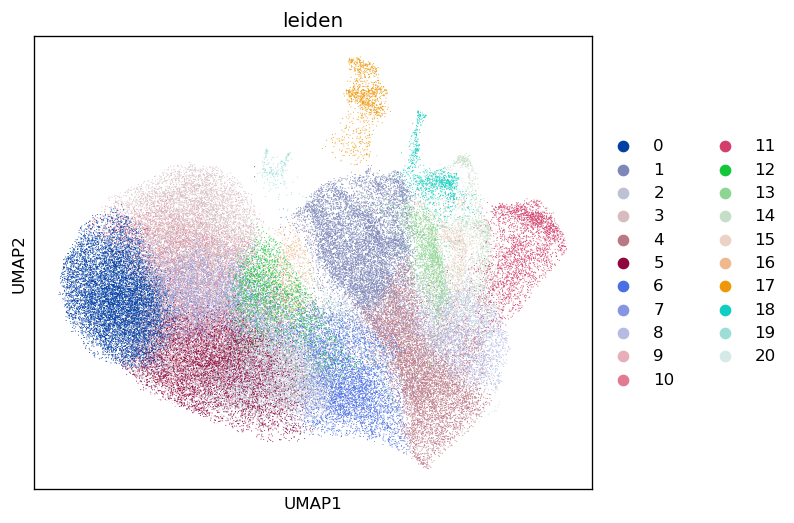

In [24]:
sc.pl.umap(adata, color='leiden')

In [25]:
list(adata.var.index)

['DAPI1',
 'Ki67',
 'FOXP3',
 'CD20',
 'CD8',
 'CD4',
 'CD31',
 'PDL1',
 'PanCK',
 'Ecadherin',
 'CD11c',
 'CD56',
 'CD44',
 'CD3e',
 'SMA',
 'CD21',
 'HLADR',
 'FAP',
 'Podoplanin',
 'CD107a',
 'CK8',
 'CD45RA',
 'LAG3',
 'Vimentin',
 'GranzymeB',
 'PD1',
 'CK7',
 'CD14',
 'CD68',
 'CD206']

In [26]:
# adata = adata[:, [True if i != 5 else False for i in range(adata.shape[1])]]
# adata

/home/estorrs/miniconda3/envs/imaging/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


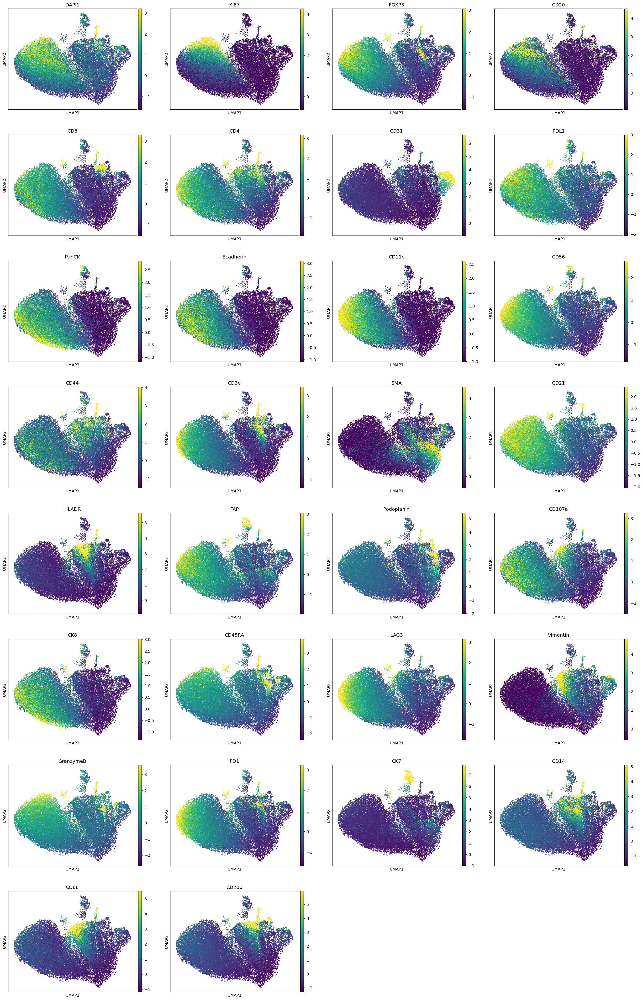

In [27]:
p = adata[np.random.choice(adata.obs.index.to_list(), size=50000, replace=False)]
sc.pl.umap(p, color=[c for c in p.var.index], size=10, save='_marker_umap.png')

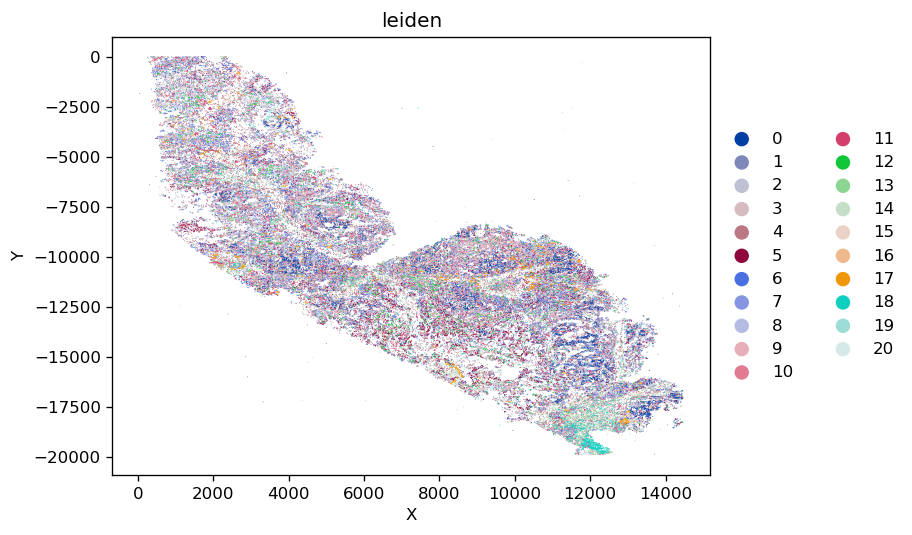

In [28]:
sc.pl.scatter(adata, x='X', y='Y', color='leiden')

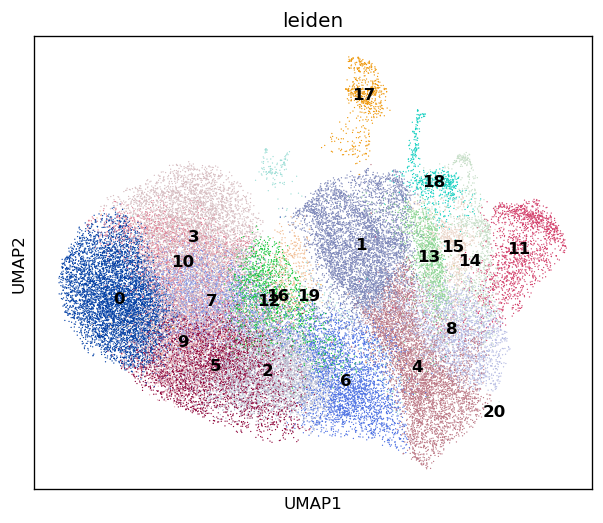

In [29]:
sc.pl.umap(p, color='leiden', legend_loc='on data')

In [72]:
clustermap = {
    'Proliferating': []
}
r = {v:k for k, vs in clustermap.items() for v in vs}
adata.obs['cell type'] = [r[l] if l in r else 'Unknown'
                          for l in adata.obs['leiden']]

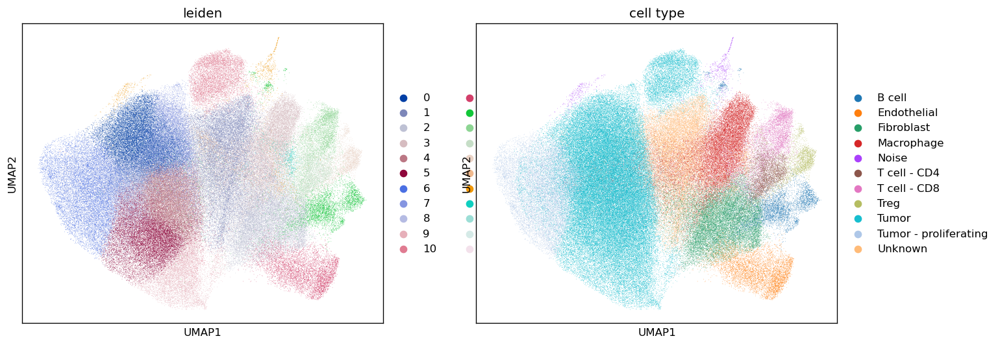

In [92]:
sc.pl.umap(adata, color=['leiden', 'cell type'], save='_cell_types.png', ncols=1)

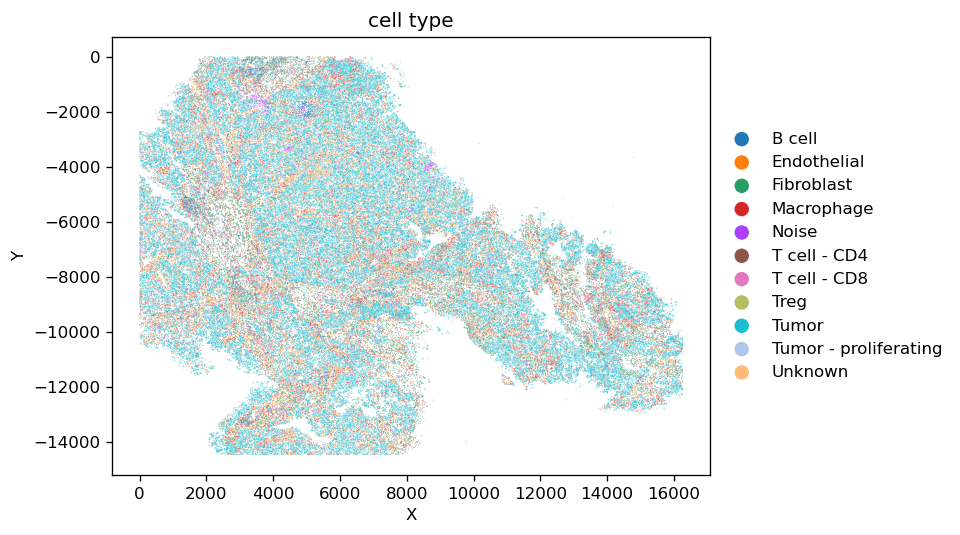

In [93]:
sc.pl.scatter(adata, x='X', y='Y', color='cell type', save='_cell_types_spatial.png')

In [75]:
adata.write_h5ad(os.path.join(out_dir, 'processed.h5ad'))

In [76]:
adata.obs.to_csv(os.path.join(out_dir, 'processed_metadata.txt'), index=False, sep='\t')

## extras

In [78]:
import scipy.spatial as spatial

d = 40.

centers = [(x, y) for x, y in zip(adata.obs['X'], adata.obs['Y'])]

point_tree = spatial.cKDTree(centers)

pt_to_neighbors = {}
for i, pt in enumerate(centers):
    pt_to_neighbors[i] = [x for x in point_tree.query_ball_point(pt, d) if x!=i]


In [79]:
# get associations
col = 'cell type'
assocs = {g:{k:0 for k in set(adata.obs[col])} for g in set(adata.obs[col])}
for k, vals in pt_to_neighbors.items():
    for v in vals:
        assocs[adata.obs[col][k]][adata.obs[col][v]] += 1

In [80]:
import seaborn as sns

In [81]:
from collections import Counter
counts = Counter(adata.obs['cell type'])

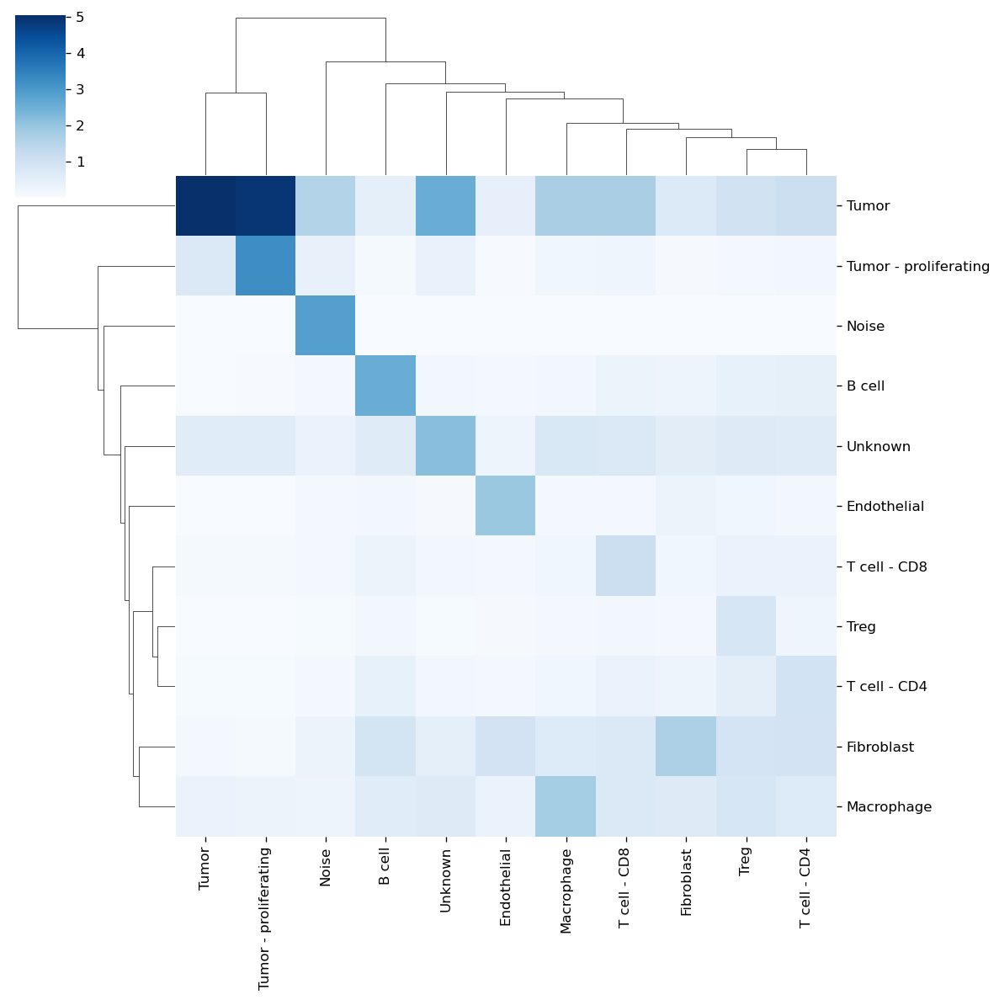

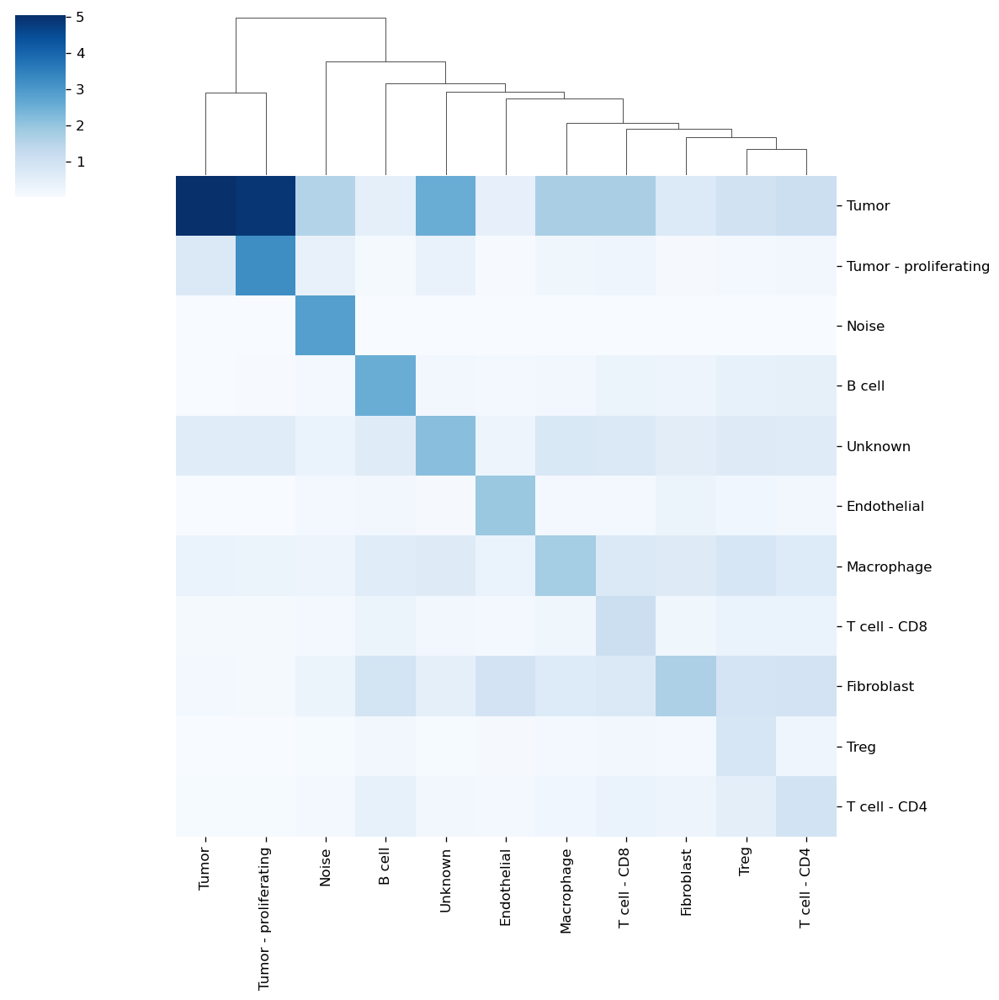

In [82]:
assocs = pd.DataFrame.from_dict(assocs)
# assocs = assocs / np.sum(assocs, axis=1)
assocs = assocs / np.asarray([counts[x] for x in assocs.columns])
# assocs = pd.DataFrame(data=np.log1p(assocs.values), columns=assocs.columns, index=assocs.index)
cg = sns.clustermap(assocs, cmap='Blues', row_cluster=True)
assocs = assocs.iloc[cg.dendrogram_col.reordered_ind]
sns.clustermap(assocs, cmap='Blues', row_cluster=False,)

In [83]:
assocs

,Tumor,Treg,Endothelial,B cell,Unknown,Noise,T cell - CD4,T cell - CD8,Fibroblast,Macrophage,Tumor - proliferating
Tumor,5.056677,0.995355,0.432327,0.510452,2.561651,1.578313,1.135298,1.715016,0.711275,1.712727,4.936976
Tumor - proliferating,0.744512,0.121622,0.045963,0.112729,0.380924,0.394148,0.192423,0.273978,0.086491,0.229876,3.234955
Noise,0.021257,0.038007,0.027646,0.033035,0.020213,2.889845,0.029064,0.029285,0.020903,0.018593,0.035201
B cell,0.031700,0.431166,0.142639,2.570735,0.165258,0.152324,0.454600,0.323703,0.289186,0.186453,0.046422
Unknown,0.600790,0.663007,0.291045,0.624113,2.177020,0.351979,0.639607,0.729363,0.561384,0.778496,0.592422
Endothelial,0.029544,0.206926,1.962008,0.156962,0.084804,0.140275,0.182802,0.146030,0.323275,0.121492,0.020829
Macrophage,0.343784,0.863176,0.356852,0.602650,0.666271,0.277108,0.680698,0.738994,0.666475,1.802864,0.305972
T cell - CD8,0.101138,0.364020,0.126018,0.307391,0.183395,0.128227,0.342153,1.135613,0.217955,0.217115,0.107140
Fibroblast,0.143165,0.921453,0.952171,0.937290,0.481789,0.312392,0.958308,0.743907,1.681562,0.668322,0.115441
Treg,0.027319,0.849662,0.083107,0.190556,0.077588,0.077453,0.250351,0.169418,0.125648,0.118027,0.022135
